## PROJECT EXPERIMENTS

- Prepared by Engin Deniz Erkan

In [ ]:
!pip install timm

In [ ]:
from google.colab import drive
import os
import sys

drive.mount('/content/drive')

output_dir = "/content/drive/MyDrive/MMI727_project_visualizations"

if not os.path.exists(output_dir):
    print(f"Directory does not exist: {output_dir}")
    sys.exit(f"Exiting program: Directory does not exist: {output_dir}")
else:
    print(f"Directory exists: {output_dir}")

In [20]:
import os
import torch
import torchvision
import torchvision.transforms as transforms
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from google.colab import drive
from tabulate import tabulate

class CustomDataset(Dataset):
    def __init__(self, file_paths, transform=None):
        self.file_paths = file_paths
        self.transform = transform

    def __len__(self):
        return len(self.file_paths)

    def __getitem__(self, idx):
        img_path = self.file_paths[idx]
        img = Image.open(img_path).convert("RGB")

        if self.transform:
            img = self.transform(img)

        # Extract class label from the image path
        class_label = int(img_path.split("_")[-1].split(".")[0])

        return img, class_label

# Transformations for all augmentations
transform_all = torchvision.transforms.Compose([
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomRotation(360),
    torchvision.transforms.RandomPerspective(),
    torchvision.transforms.GaussianBlur(3),
    torchvision.transforms.RandomGrayscale(p=0.1),
    torchvision.transforms.RandomResizedCrop([224, 224]),
    transforms.ToTensor()
])

# Transformations for one augmentation
transform_one = torchvision.transforms.Compose([
    torchvision.transforms.RandomResizedCrop([224, 224]),
    transforms.ToTensor()
])

num_iterations = 30 # Each dataloader have 300 (10*30) images

image_directories = "/content/drive/MyDrive/MMI727_project_visualizations"

class_labels = [2, 76, 107, 340, 440, 479, 546, 836, 852, 947]

# Dataloader for ResNet images
resnet_file_paths_all = []
resnet_file_paths_one = []

for _ in range(num_iterations):
    resnet_file_paths_all += [os.path.join(image_directories, f"ResNet_all_augmentations_target_class_{class_label}.png") for class_label in class_labels]
    resnet_dataset_all = CustomDataset(resnet_file_paths_all, transform=transform_all)

resnet_dataloader_all = DataLoader(resnet_dataset_all, batch_size=8, shuffle=True)

for _ in range(num_iterations):
    resnet_file_paths_one += [os.path.join(image_directories, f"ResNet_one_augmentation_target_class_{class_label}.png") for class_label in class_labels]
    resnet_dataset_one = CustomDataset(resnet_file_paths_one, transform=transform_one)

resnet_dataloader_one = DataLoader(resnet_dataset_one, batch_size=8, shuffle=True)

# Dataloader for ViT images
vit_file_paths_all = []
vit_file_paths_one = []

for _ in range(num_iterations):
    vit_file_paths_all += [os.path.join(image_directories, f"Vit_all_augmentations_target_class_{class_label}.png") for class_label in class_labels]
    vit_dataset_all = CustomDataset(vit_file_paths_all, transform=transform_all)

vit_dataloader_all = DataLoader(vit_dataset_all, batch_size=8, shuffle=True)

for _ in range(num_iterations):
    vit_file_paths_one += [os.path.join(image_directories, f"Vit_one_augmentation_target_class_{class_label}.png") for class_label in class_labels]
    vit_dataset_one = CustomDataset(vit_file_paths_one, transform=transform_one)

vit_dataloader_one = DataLoader(vit_dataset_one, batch_size=8, shuffle=True)

# Pretrained ViT model
model_vit = torch.hub.load('facebookresearch/deit:main', 'deit_base_patch16_224', pretrained=True)
model_vit.eval()

# Pretrained ResNet model
model_resnet = torchvision.models.resnet18(pretrained=True)
model_resnet.eval()

# Test the models on the datasets
def test_model(model, dataloader):
    correct = 0
    total = 0

    with torch.no_grad():
        for data in dataloader:
            inputs, labels = data
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = correct / total
    return accuracy

# DataFrame to store the results
results_df = pd.DataFrame(columns=['Model', 'Augmentation', 'Accuracy'])

# Create a list to store the results
results_list = []

vit_accuracy_all = test_model(model_vit, resnet_dataloader_all)
vit_accuracy_one = test_model(model_vit, resnet_dataloader_one)
resnet_accuracy_all = test_model(model_resnet, vit_dataloader_all)
resnet_accuracy_one = test_model(model_resnet, vit_dataloader_one)

# Format accuracy to two decimal places
def format_accuracy(accuracy):
    return f"{accuracy:.2f}%"

results_list.append({'Prediction Model': 'VIT', 'Used Images': '300 ResNet images (augmented)', 'Accuracy': format_accuracy(vit_accuracy_all * 100)})
results_list.append({'Prediction Model': 'VIT', 'Used Images': '300 ResNet images (not augmented)', 'Accuracy': format_accuracy(vit_accuracy_one * 100)})
results_list.append({'Prediction Model': 'ResNet', 'Used Images': '300 VIT images (augmented)', 'Accuracy': format_accuracy(resnet_accuracy_all * 100)})
results_list.append({'Prediction Model': 'ResNet', 'Used Images': '300 VIT images (not augmented)', 'Accuracy': format_accuracy(resnet_accuracy_one * 100)})

results_df = pd.DataFrame(results_list)

def format_headers(dataframe, headers):
    formatted_headers = []
    for header in headers:
        if header in dataframe.columns:
            formatted_headers.append(f"\033[1;31m{header}\033[0m")  # Red color and Bold
        else:
            formatted_headers.append(header)
    return formatted_headers

print(tabulate(results_df, headers=format_headers(results_df, results_df.columns), tablefmt='double_grid', showindex=False))

Using cache found in /root/.cache/torch/hub/facebookresearch_deit_main
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


╔════════════════════╦═══════════════════════════════════╦════════════╗
║ Prediction Model   ║ Used Images                       ║ Accuracy   ║
╠════════════════════╬═══════════════════════════════════╬════════════╣
║ VIT                ║ 300 ResNet images (augmented)     ║ 60.67%     ║
╠════════════════════╬═══════════════════════════════════╬════════════╣
║ VIT                ║ 300 ResNet images (not augmented) ║ 51.33%     ║
╠════════════════════╬═══════════════════════════════════╬════════════╣
║ ResNet             ║ 300 VIT images (augmented)        ║ 4.67%      ║
╠════════════════════╬═══════════════════════════════════╬════════════╣
║ ResNet             ║ 300 VIT images (not augmented)    ║ 2.33%      ║
╚════════════════════╩═══════════════════════════════════╩════════════╝


### The code below was written so that we can visually see the model performances. In the real data set, each Dataloader contains 300 image data, but only the first 10 are shown here.

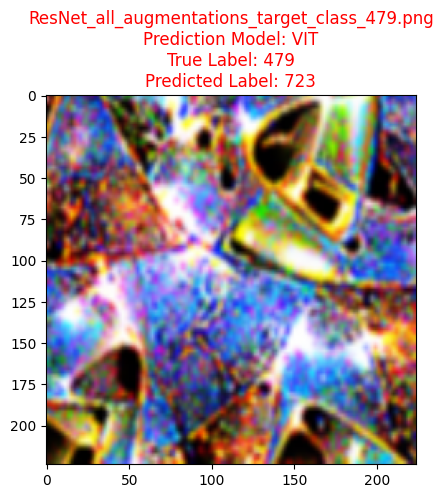

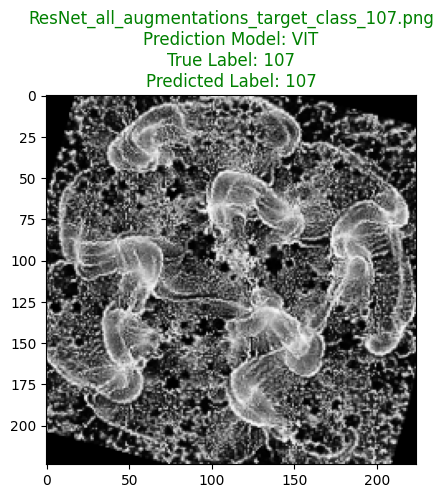

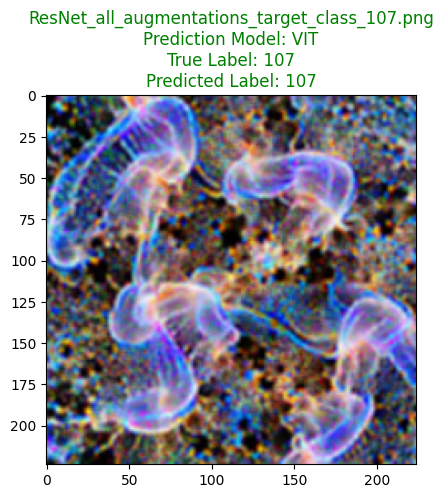

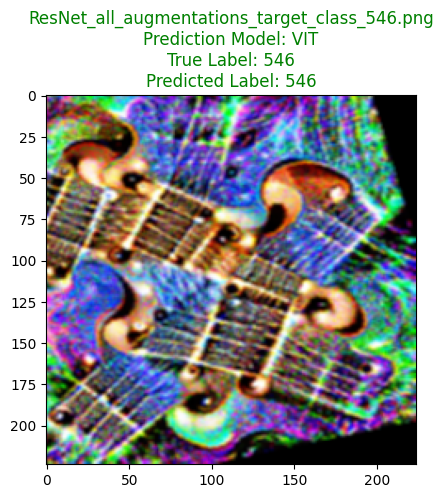

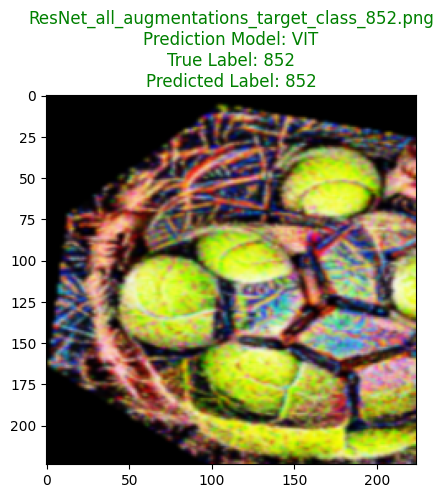

...

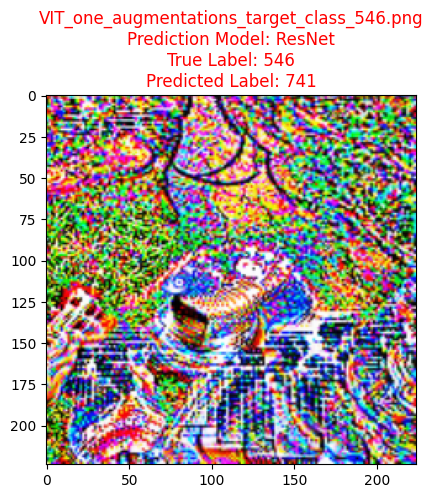

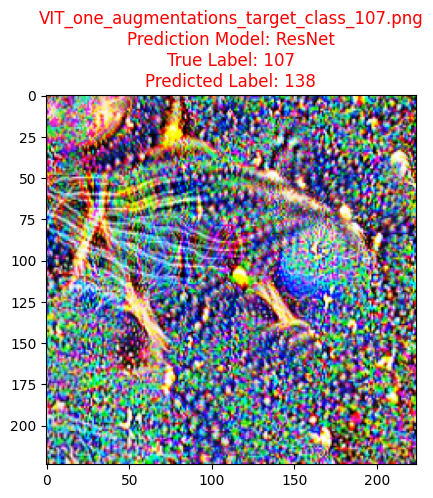

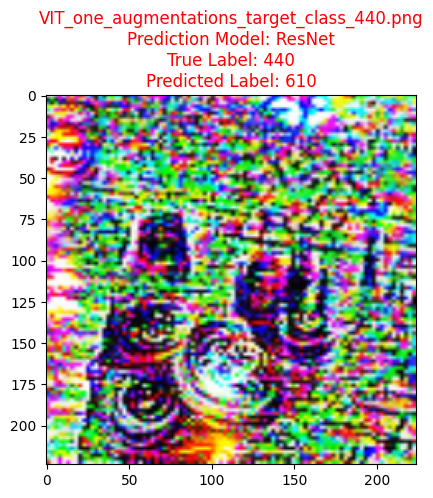

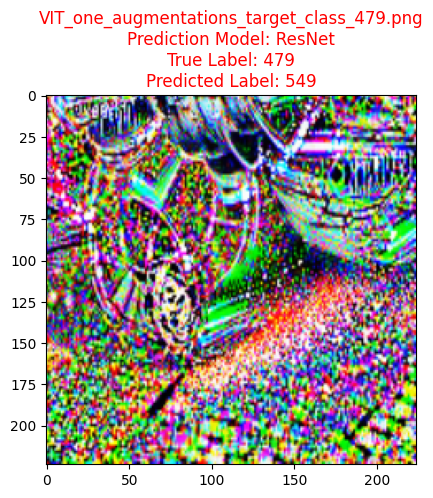

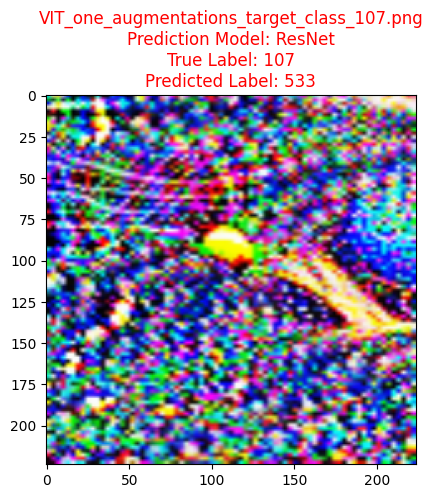

In [22]:
import torch
import matplotlib.pyplot as plt
import numpy as np


def imshow(img, title, true_label, predicted_label):
    img = np.transpose(img.numpy(), (1, 2, 0))
    plt.imshow(img)

    title_color = 'green' if true_label == predicted_label else 'red'
    plt.title(title, color=title_color)

    plt.show()

def print_images(model, dataloader, model_name, num_images=10):
    with torch.no_grad():
        image_count = 0
        for data in dataloader:
            inputs, labels = data
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)

            for i in range(inputs.size(0)):
                if image_count >= num_images:
                    break  # Exit the loop if we have printed the desired number of images

                img = inputs[i]
                true_label = labels[i].item()
                predicted_label = predicted[i].item()

                if dataloader == vit_dataloader_all or dataloader == vit_dataloader_one:
                    dataset_name = "VIT"
                else:
                    dataset_name = "ResNet"

                image_name = f"{dataset_name}_{'all' if dataloader == vit_dataloader_all or dataloader == resnet_dataloader_all else 'one'}_augmentations_target_class_{true_label}.png"
                title = f"{image_name}\nPrediction Model: {model_name}\nTrue Label: {true_label}\nPredicted Label: {predicted_label}"

                imshow(img, title, true_label, predicted_label)
                image_count += 1

            if image_count >= num_images:
                break  # Exit the outer loop if we have printed the desired number of images

# Print only the first 10 images for each case

# Print first 10 images for ViT model on ResNet images (augmented)
print_images(model_vit, resnet_dataloader_all, "VIT", num_images=10)

# Print first 10 images for ViT model on ResNet images (not augmented)
print_images(model_vit, resnet_dataloader_one, "VIT", num_images=10)

# Print first 10 images for ResNet model on ViT images (augmented)
print_images(model_resnet, vit_dataloader_all, "ResNet", num_images=10)

# Print first 10 images for ResNet model on ViT images (not augmented)
print_images(model_resnet, vit_dataloader_one, "ResNet", num_images=10)
